# Lecture 2: Theory and Models

This week we are going to learn about why it is so important to think theoretically in political science, and the scientific process more generally. Science requires an interplay of theory and data, and most of what you learn in Data 8 is, unsurprisingly given the name, more on the data end. These next few weeks are going to be about adding a bit of balance to that.

We are going to start with a relatively general discussion of theorizing, and then will get into some of the more concrete ways that political scientists often theorize with tools like expected utility and game theory in the coming weeks.

Whether we are using game theory or some other method, theorizing means coming up with simplified versions of the world, which we call models. We don’t simplify because we are narrow-minded thinkers who can’t handle complexity (though that may be true!), but because this is the only way to get any traction in figuring out what key variables drive the political outcomes we care about.

We will talk about what makes a theory or a model good or bad, with the caveat that there are no formulas here and we often need to apply our best judgement. 

As this all gets quite, well, theoretical, I’ll try to keep us grounded by exploring these ideas with two running examples: one about the relationship between economic performance and electoral success, which has important implications for understanding democracy (and less democratic political systems). The second is about what drives segregation. 


## More money better outcomes?

Just like last week, let’s get started by looking at some data. This comes from a great website called <a href="https://ourworldindata.org/grapher/life-expectancy-vs-gdp-per-capita">Our World in Data</a>.

In [1]:
# Importing libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

<AxesSubplot:xlabel='GDP per capita', ylabel='Life expectancy at birth (historical)'>

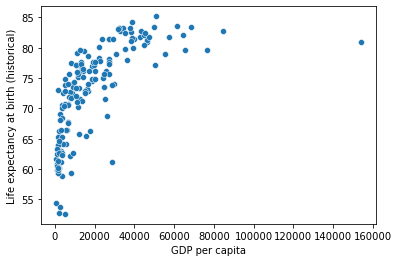

In [2]:
life = pd.read_csv("data/life-expectancy-vs-gdp-per-capita.csv")
life2018 = life[life['Year']==2018]
life2018
sns.scatterplot(x='GDP per capita', y='Life expectancy at birth (historical)', data=life2018)

As a reminder, this is a scatter plot, showing us the relationship between two variables. In this case, the horizontal axis plots the GDP per capita of a country -- in short, how wealthy the average person is in a country -- and the life expectancy -- how long the average person lives -- on the y axis. Probably not too surprising. 

<AxesSubplot:xlabel='GDP per capita', ylabel='Life satisfaction'>

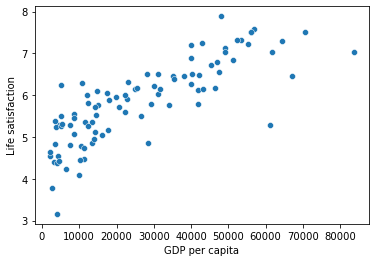

In [3]:
happy = pd.read_csv("data/gdp-vs-happiness.csv")
happy2018 = happy[happy['Year']==2018]
sns.scatterplot(x='GDP per capita', y='Life satisfaction', data=happy2018)

This graph also has GDP per capita on the x axis, and the y axis is the average of how people respond to a survey question about how happy they are with their lives. Again, we see a positive relationship. Combining the two, people seem to live longer and enjoy those lives more when the economy is strong.

The next graph is a bit different. Here we are just looking at the United States, and our x axis is how much the economy grows in the first half of a presidential election year. And rather than looking at individual satisfaction, the y axis is plotting how well the incumbent party -- that is, the one who was in office at the time of the election -- does in that election. So, if the president is running for re-election (for example, Obama in 2012), we plot his party’s vote share. If not, (think the Democrats in 2000, when Bill Clinton reached his term limit and Al Gore was the nominee) we plot the vote share of the candidate from the same party. 

Text(0, 0.5, 'Incumbent Vote Share')

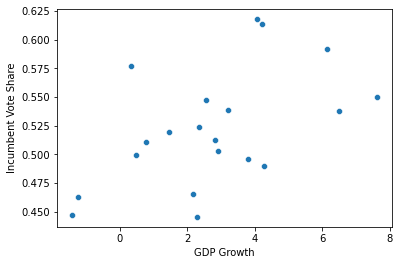

In [4]:
pv = pd.read_stata("data/presvote.dta")
pv = pv[pv['year'] >=1940]
sns.scatterplot(x='gdpchange', y='incvote', data=pv)
plt.xlabel('GDP Growth')
plt.ylabel('Incumbent Vote Share')

What does this graph show us? There is a moderately strong relationship, where if the economy is going well, the party in power tends to do well. 



I’ll stop showing you more graphs, but take me at my word that this pattern is consistent in democratic countries. (Why do I say democratic countries? Would we expect to see this in North Korea? They do hold elections!) And for reasons we’ll discuss, I think this is one of the most theoretically important empirical facts in political science. 

Before we get to the broader theoretical implications, let’s think about the implications of this from the perspective of a democratic leader who is up for reelection. For simplicity, suppose our democratic leader has the power to print money and give it to people. It looks like if citizens have more money in their pocket, they will be happier, and the leader will be be more likely to get-relected. What could go wrong?

## The perils of being too simplistic

Here is what can go wrong. 
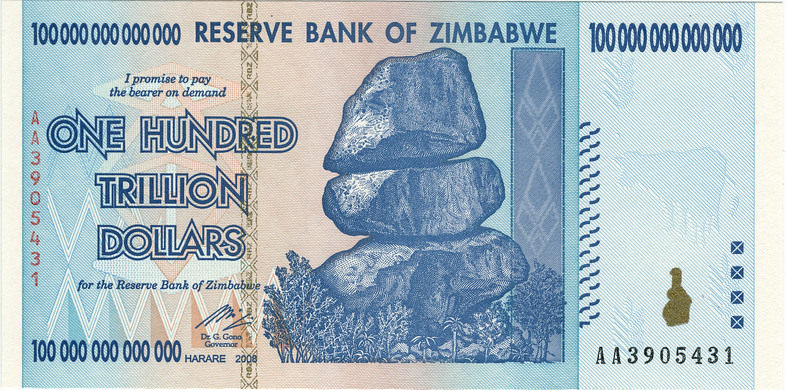


In Zimbabwe under Robert Mugabe (not quite North Korea, but not the most democratic country in the world), the government printed lots of money to try and improve the lot of their citizens, and lo and behold inflation exploded, that is, since there was so much cash floating around, the price of things shot up. Things got to the point where they had to start printing 100 hundred trillion dollar bills, which may not have been enough to buy a loaf of bread. Mugabe did survive this episode, serving as president for 30 years, but it was a <a href="https://en.wikipedia.org/wiki/2005_Zimbabwean_parliamentary_election">close call</a>. 

Zimbabwe isn’t the only place where events like this have happened, albeit usually not as extreme. Printing money and giving it away puts more money in pockets, but doesn’t necessarily make people able to buy more things, because of inflation. Some people think printing money is still a good idea in some contexts. But none will argue that if we magically turn all the 1 dollar bills into 100 dollar bills (or 100 trillion dollar bills) this will make everyone orders of magnitude better off.


Where did we go wrong in our inference that printing money would make everyone happier and reward the government for their brilliance? I'd argue the key problem is that we had an oversimplifed theory of the relationship between how much money people have and these outcomes, or arguably we didn’t have a meaningful theory at all. We just looked at some graphs and said “more money = better outcomes”. 

A more sophisticated model is that people are happier and healthier when they can afford to buy things like nutritious food, health care, nice clothes, etc. In this conception, policy choices which make it easier for people to buy things they want will make them happier and more likely to re-elect their politicians. However, printing money may not accomplish this.

You may be thinking “that isn’t a particularly sophisticated model either!” Even the most materialistic among us care about more than the purchasing power of our bank accounts, and when we are deciding who to vote for we also care about things like whether the incumbent has set social policies we like, whether they are corrupt, and whether they have done a good job in foreign policy.

However, when we want to understand why governments set the monetary policy they do, we might be able to set aside these other concerns. This gets at the key tradeoff when theorizing: we want our model of the world to be simple enough to focus on the decisions we are study, but not so oversimplified that we think trillion-dollar bills are the solution to life’s problems.

## A Model of accountability
To explore this more concretely, let’s construct a theory of the relationship between what politicians do in office and whether they get re-elected. The political science phrase for this the study of democratic accountability, and it’s a key idea underlying a lot of what we study. More specifically, we will look at the relationship between economic performance and getting re-elected. 

Why the economy grows and why people vote the way they do are both huge questions. So if we want to maximize realism on both ends of this relationship (the economy and vote choices), we may need to consider a good 40% of things written in the social sciences. Not only is that impractical for the researcher, if we try to summarize a study containing all this complexity, our readers will be totally lost even if it makes sense to us.

Let’s try to strike a balance and come up with a simple theory which still captures some core features of how elections and economies work. Let’s suppose that:
- One important concern for people when deciding to vote for is whether they think the candidate/party will manage the economy well, or at least in a way that will be good for their personal finances
- Political leaders have some control over the health of the economy. 
- Some politicians are better at managing the economy than others, or prioritize the health of the economy over trying to siphon money to their cronies. 



We’ll discuss using mathematical models like game theory to understand situations like this in the coming weeks, but for now let’s just reason through the implications with words. Given these assumptions, voters will learn something about whether the incumbent president or their party are good at managing the economy by looking at the state of the economy, either their personal situation or more broadly. So if they want to re-elect politicians who will continue to do a good job of managing the economy, they can look to past performance, and be more apt to re-elect presidents when the economy went well under their stewardship. Even if voters care about other things as well, in aggregate we should see higher vote shares for politicians who generate more economic growth, which is what we observe in the data.

Why is this such an important idea? This model highlights one reason why democracy may be a successful form over government. Citizens delegate running the economy and other aspects of the government to elected leaders. If these leaders do a good job, they get rewarded, and so they have incentives to do what voters want. 


## Is this too simple?

You may be thinking “that was a lot of ‘assuming’ and ‘supposing’, including some potentially unrealistic, or at least heavily simplifying assumptions and suppositions. Voters obviously care about more than just the economy. And whether president’s have a lot of control over economic performance is actually a hotly debated question. 

Rather than litigate this individual assumptions, just note that all this assuming and simplifying can drive you crazy, particularly if you don’t like the conclusions of the theory. 

To defend the broad practice of simplifying, first note that it is not just us small-minded social scientists who need to do it; simplifying assumptions abound in the hard sciences. In your phsysics class you studied motion “in a vacuum” without wind resistance. In chemistry, you studied chemical reactions as if we can combine solutiosn with one molecule each. 




The common element here is that even if these assumptions are “wrong” for many purposes, they make our theory much more tractable. We can study the motion of objects without wind resistance with relatively simple quadratic equations; things get much much harder if we have to incorporate air resitance.

This isn’t to say that we just have to accept any assumptions or simplifications without criticism. It's just that point out that an assumption isn’t 100% accurate isn’t producive, because it’s essentially always true. True, there is air resistance on earth, but it’s not like because of this we shouldn’t bother studying Newtoniam mechanics, which are still remarkably accurate.

One of my favorite quotes on this comes from the sociologist Keiran Healy, who writes **“Things are always more complicated than that, for any value of that.”** 

More productive critiques will state exactly why assumptions don’t hold, and think through their consequences. If you are trying to predict where a ball thrown on earth will land, or try and understand the path of a <a href="https://en.wikipedia.org/wiki/Curveball">curveball</a>, it’s perfect fair to say “we need to study air resistance to do that”, because we can’t understand curveballs in a vacuum. Back to our political example, for studying some questions it will be important to consider other motives for voting, but sometimes we can assume they are primarily driven by material concerns. It also might be important to study questions like “what if people don’t pay attention to economic circumstances” if that is our question of interest. 

## Maps as Models

Now let’s take another perspective about what theories are model are supposed to do, by analogy. My favorite analogy for what models do is that they are like maps. For those with literary inclinations, one of the most famous examples of this comes from the Argentinan author Jorge Luis Borges. In an amazingly short <a href="https://kwarc.info/teaching/TDM/Borges.pdf">short story</a>, Borges describes an empire that valued making maps, and wanting their maps to be extremely accurate they kept making larger and more detailed ones, eventually making a map of their empire whos size was that of the empire. But of course such a map is useless, certainly for carrying around. And it’s clear Borges saw the connection to theories and science here, since the title of the short story is “On the Exactitude of Science”

Less poetically, here is why this is a great analogy: maps are simplifications, and simplifications for a specific purpose. 



All maps simplify in lots of ways: they project a three dimensional reality to two dimensions, and are typically static and unchanging. Further, they throw out a ton of detail. For example, a BART map contains a rough outline of where there is land and water in the area, a few general place names (“East bBy”), and, more importantly, all of the stops and which lines service them. It doesn’t include streets, bike lanes, landmarks that aren’t stops, elevation, etc. 

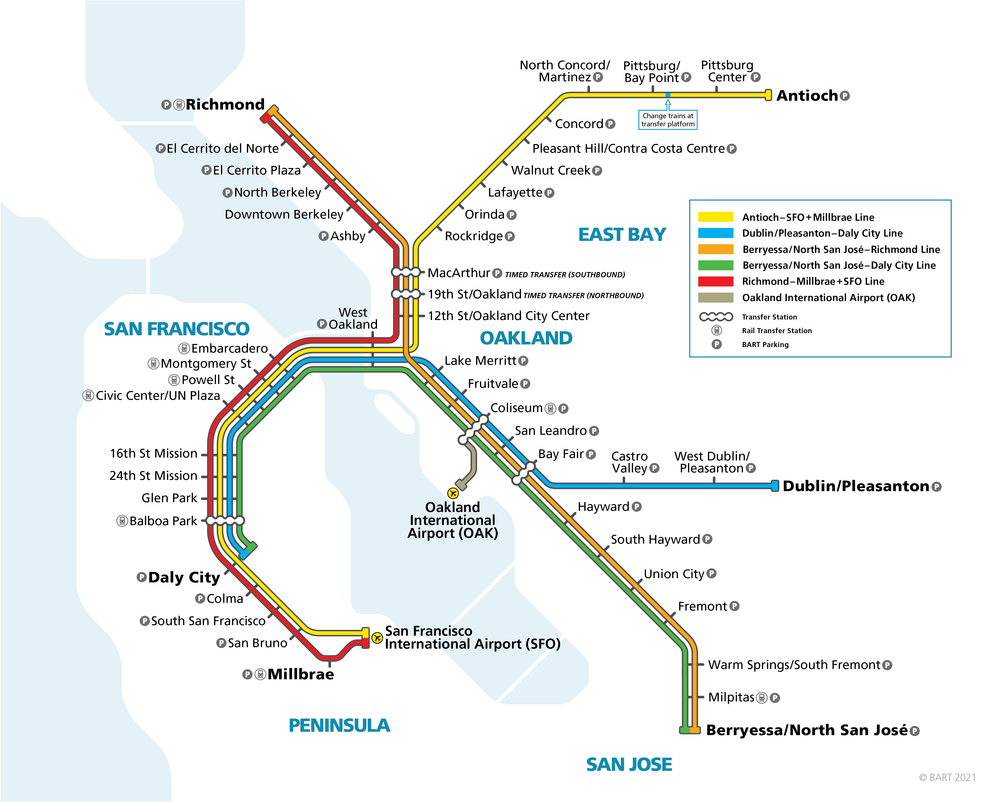




The reason it doesn’t include those things isn’t because the mapmakers are unaware of their existence, or that some people might want that information, but because the goal of the map is to help people navigate the subway system. And with this goal in mind, it helps the user to just include the most relevant information. It’s not a problem that the BART map doesn’t include things like streets and elevation because there are other maps out there that have this information. If your goal is to drive (think before we just asked our phones for directions), you need a street map. If you are biking, it will also be nice to add bike lanes.


Even in more modern times when we typically ask our phones for directions, mapping software will give you different information based on your mode of transportation. When giving a bike route, it will tell you how much elevation change there will be on the route, but not if you ask for public transportation directions. And if you ask for public transportation directions, it will give you prices.

Just like this, we will typically want to have multiple models to study things like who wins elections, or what leads to successful protest movements. Coming up with a unified theory of what makes protest work is impossible; rather, we have different models to studying different questions like the role of social media, or government repression, or racial solidarity. 



## Maps of Segregation

To see these ideas in action, we are going to study one more model, which coincidentally I’ll be motivating by some maps. Here is a map of a good chunk of the Bay Area, including Berkeley. 
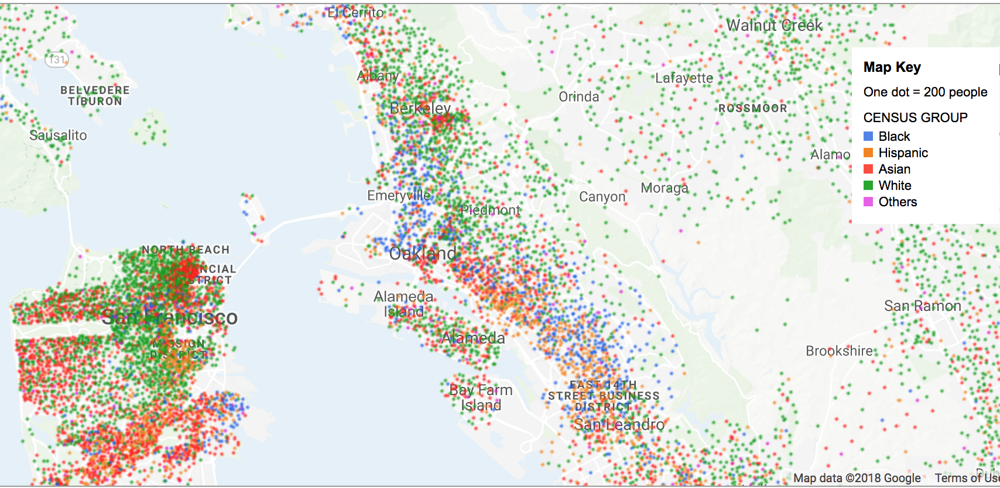



Each dot correspond to a fixed number of people from a census-defined racial category.     

We can see that parts of Oakland, like West Oakland, are primarily blue and orange dots, meaning they are primarily black and hispanic. North Berkeley has a lot more green dots, for white folks, as do parts of San Franciso. Tellingly the parts of Berkeley just around campus are pretty dense, and if you squint you see a variety of colors, meaning the area is relatively diverse.

If you think segregation in the Bay Area is bad, here is Los Angeles. Here there are huge pockets that are almost entirely, White, Hispanic, Asian, and Black. 

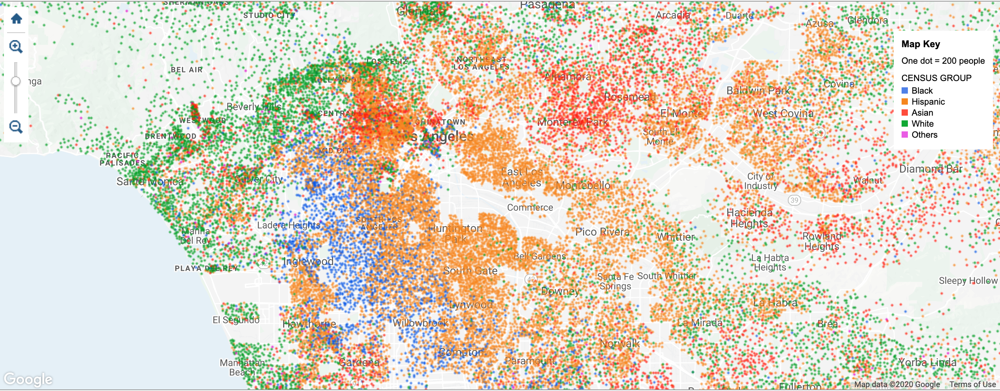



Then there is Chicago, where it almost seems like there are straight lines dividing where different racial groups live. We won’t get into the history here, but this isn’t a coincidence, as housing policy purposefully kept racial groups in different neighborhoods.

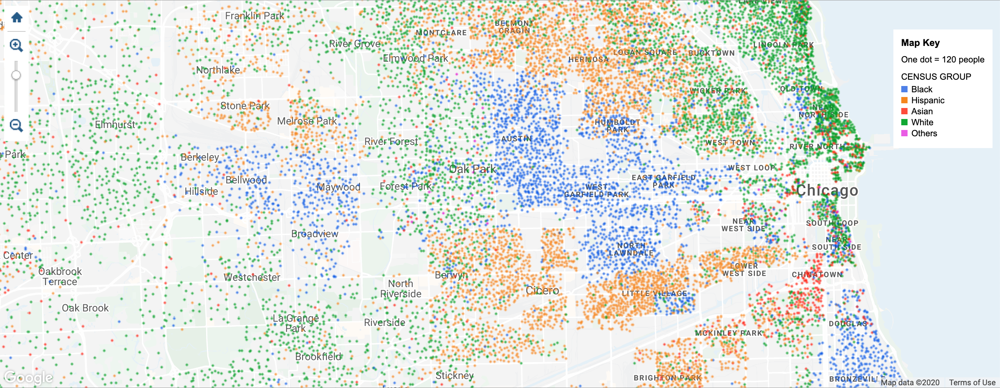

## A Model of Segregation

This is some data that we might want to explain, and so let’s think about coming up with a model of segregation. A natural interpretation of the data is that people just don’t like living near other groups. There is probably some truth to this, but there are a few problems. First, it’s not a particularly helpful theory: as it essentially just assumes the result. Second, it isn’t consistent with what people say they want in where they live, at least in more modern times. And maybe most important, it probably doesn’t help us explain why some areas are more segregated than others: is this entirely driven by differences in racism? Again, this may be part of the explanation, but it's also worth exploring other structural factors which drive segregation levels too.

The model we are going to study is going to help us think through this, and will help us answer questions like “how strong of a desire to live near members of the same group is required to get segregation”, “does it matter if people care more about living close to their ingroup or away from the outgroup,” and and “how does housing availability affect segregation”?



Here is the first version of the model we will study, which was developed by Thomas Schelling. Suppose there are just two groups A and B. We are going to start with a status quo allocation of houses, where each house has an A, a B, or is empty (maked with a "_"). To make things easy, we are going to align our houses on one dimension, and define the neighbors as the houses directly to the left and right. Here is an example with 9 houses:

| 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 |
|---|---|---|---|---|---|---|---|---|
| A | B | A | B | A | B | A | B | _ |

As we run our model/algorithm, we are going to sequentially ask households if they want to move. In particular, we start by asking house 1 if they want to move, and if so they do. If not, we ask house 2 if they want to move, and if so they do. If not we move on to house 3, etc. After anyone moves, we will start again with house 1.

When do households want to move? First, let’s assume the goal of our households is to have as many in-group neighbors as possible. In particular, if there is an empty house that would give them more in-group neighbors, they will go there. Note this means they dislike the outgroup, they just want to have some neighbors who are like them. 



Let’s see how this algorithm shakes out with this initial allocation. 

The A in house 1 has no A neighbors, so they would like to move, but the only empty house is 9 which has no A neighbors either. So they stay.

The next house that has a chance to move is the B in slot 2. This B has no B neighbors, and by moving to slot 9 they would have one, and so they move. So we can track how things over time, let's place this new arrangement below the old one:

| 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 |
|---|---|---|---|---|---|---|---|---|
| A | B | A | B | A | B | A | B | _ |
| A | _ | A | B | A | B | A | B | B |

Now we start again and ask the house in slot 1 if they want to move. They can add an A neighbor by moving to slot 2 and so they do, resulting in:

| 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 |
|---|---|---|---|---|---|---|---|---|
| A | B | A | B | A | B | A | B | _ |
| A | _ | A | B | A | B | A | B | B |
| _ | A | A | B | A | B | A | B | B |

Continuing this procedure without explaining each step (though make sure each makes sense!) gives:

| 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 |
|---|---|---|---|---|---|---|---|---|
| A | B | A | B | A | B | A | B | _ |
| A | _ | A | B | A | B | A | B | B |
| _ | A | A | B | A | B | A | B | B |
| A | A | A | B | _ | B | A | B | B |
| A | A | A | _ | B | B | A | B | B |
| A | A | A | A | B | B | _ | B | B |
| A | A | A | A | _ | B | B | B | B |

What we learn from this first example is that even a preference to live close to similar people can lead to complete segregation, even absent any outgroup antipathy. 

The power of this approach is not how it shakes out in this particular example, but that we can modify our initial allocation and algorithm and see how that affects the resulting level of segregation. For example we could change our initial allocation to have a majority group and a minority group rather than an even split, we could have more empty houses, we could have more than two groups. We could also change the moving rule, maybe assuming they dislike living next to the outgroup as well, or perhaps dislike being next to empty houses. We could also see what happens with heterogenous preferences; maybe only group A wants to avoid group B. 

We will start to ask some of these questions in the lab.

## Wrapping up

Before the scientific methods was really codified, curious people still tinkered, and here is a nice quote describing the tendencies of one of them. “A natural experimenter and observer, he was neither wired nor trained to wrestle with abstract concepts. He preferred to induce from experiments rather than deduce from theoretical principles'' 

This is about someone you probably associate more with art, Leonardo da Vinci, who also was an inventor, and studied things as far flung as how to create a flying machine to how blood flows in the heart. While he was primarily just a tinkerer, later in life he came to appreciate the importance of theory, saying “Those who are in love with practice without theoretical knowledge are like the sailor who goes onto a ship without a rudder or compass and who can never be certain whither he is going”.

I hope you are convinced that both for practical purposes and for curiosity, we want to know the answer to why questions, and no amount of data will get you there without theory. 
			
		